## Импорты

In [20]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib.colors import ListedColormap
from sklearn.covariance import EllipticEnvelope
from sklearn.ensemble import IsolationForest
from sklearn.inspection import DecisionBoundaryDisplay
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

plt.style.use("dark_background")  # для модных черных рисунков

## Константы

In [21]:
N_THREADS = 1
RANDOM_STATE = 101
TEST_SIZE = 0.3

## Загрузка и разбиение данных

In [22]:
df = pd.read_csv("user_behavior_dataset.csv")

**Описание признаков**

| Признак                     | Оригинальное название              | Описание                                                                 |
|-----------------------------|-------------------------------------|--------------------------------------------------------------------------|
| Идентификатор пользователя  | User ID                            | Уникальный идентификатор для каждого пользователя.                      |
| Модель устройства           | Device Model                       | Модель смартфона пользователя.                                          |
| Операционная система        | Operating System                   | Операционная система устройства (iOS или Android).                      |
| Время использования приложений | App Usage Time                    | Ежедневное время, проведённое в мобильных приложениях, измеряется в минутах. |
| Время активности экрана     | Screen On Time                     | Среднее количество часов в день, когда экран активен.                   |
| Разряд батареи              | Battery Drain                      | Ежедневное потребление заряда батареи в мАч.                            |
| Количество установленных приложений | Number of Apps Installed           | Общее количество приложений, доступных на устройстве.                   |
| Использование данных        | Data Usage                         | Ежедневное потребление мобильных данных в мегабайтах.                   |
| Возраст                     | Age                                | Возраст пользователя.                                                  |
| Пол                         | Gender                             | Пол пользователя (мужской или женский).                                |
| Класс поведения пользователя | User Behavior Class                | Классификация поведения пользователя на основе паттернов использования (от 1 до 5). |


In [23]:
df.head()

,User ID,Device Model,Operating System,App Usage Time (min/day),Screen On Time (hours/day),Battery Drain (mAh/day),Number of Apps Installed,Data Usage (MB/day),Age,Gender,User Behavior Class
0,1,Google Pixel 5,Android,393,6.4,1872,67,1122,40,Male,4
1,2,OnePlus 9,Android,268,4.7,1331,42,944,47,Female,3
2,3,Xiaomi Mi 11,Android,154,4.0,761,32,322,42,Male,2
3,4,Google Pixel 5,Android,239,4.8,1676,56,871,20,Male,3
4,5,iPhone 12,iOS,187,4.3,1367,58,988,31,Female,3


Для анализа будем использовать признаки `App Usage Time (min/day)`, `Battery Drain (mAh/day)`, `Age`.

Выполним разбиение на тренировочную и тестовую выборки.

In [24]:
df_train, df_val = train_test_split(df, test_size=TEST_SIZE, random_state=RANDOM_STATE)
df_train.reset_index(drop=True, inplace=True)
df_val.reset_index(drop=True, inplace=True);

Выполним стандартизацию признаков.

In [25]:
scaler = StandardScaler()

df_train[
    ["App Usage Time (min/day) scaled", "Battery Drain (mAh/day) scaled", "Age scaled"]
] = scaler.fit_transform(
    df_train[["App Usage Time (min/day)", "Battery Drain (mAh/day)", "Age"]]
)
df_val[
    ["App Usage Time (min/day) scaled", "Battery Drain (mAh/day) scaled", "Age scaled"]
] = scaler.transform(
    df_val[["App Usage Time (min/day)", "Battery Drain (mAh/day)", "Age"]]
)

Дополнительно создадим отдельные датафреймы с 2 признаками.  
  
Будем рассматривать зависимости:  
- разрядки батареи от продолжительности использования девайса;  
- возраста от продолжительности использования девайса.

In [26]:
df_train_time_battery = df_train[
    ["App Usage Time (min/day) scaled", "Battery Drain (mAh/day) scaled"]
]
df_train_time_age = df_train[["App Usage Time (min/day) scaled", "Age scaled"]]

df_val_time_battery = df_val[
    ["App Usage Time (min/day) scaled", "Battery Drain (mAh/day) scaled"]
]
df_val_time_age = df_val[["App Usage Time (min/day) scaled", "Age scaled"]]

Функция для визуализации данных.

In [27]:
def plot_data(
    ax, X, name="", marker="+", colors=("#FF0000", "#0000FF"), alpha=0.7, s=100
):
    """Визуализация двумерных  данных для поиска аномалий
    Входные переменные:
    ===========
    ax: отдельная ячейка объекта figure
    X: набор данных, содержащий признаки X
    name: название графика
    marker: тип маркера - по умолчанию просто круги
    colors: цвета, которые будут использоваться для раскраски разных классов - по умолчанию Красный и Синий
    alpha: прозрачность маркеров
    s: размер маркера (~ квадрат радиуса)
    """

    ax.set_title(name, fontsize=15)  # прописываем название графика
    ax.scatter(X.iloc[:, 0], X.iloc[:, 1], marker=marker, c=colors[0], s=s, alpha=alpha)

    x_min, x_max = X.iloc[:, 0].min() - 0.08, X.iloc[:, 0].max() + 0.08

    if X.columns[1] == "Age":
        y_min, y_max = X.iloc[:, 1].min() - 0.1, X.iloc[:, 1].max() + 0.1
    else:
        y_min, y_max = X.iloc[:, 1].min() - 0.1, X.iloc[:, 1].max() + 0.1

    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)

    ax.set_xlabel(X.columns[0], fontsize=12)
    ax.set_ylabel(X.columns[1], fontsize=12)

    # Немного красоты и аккуратности
    ax.grid(True, alpha=0.2)

Визуализируем данные.

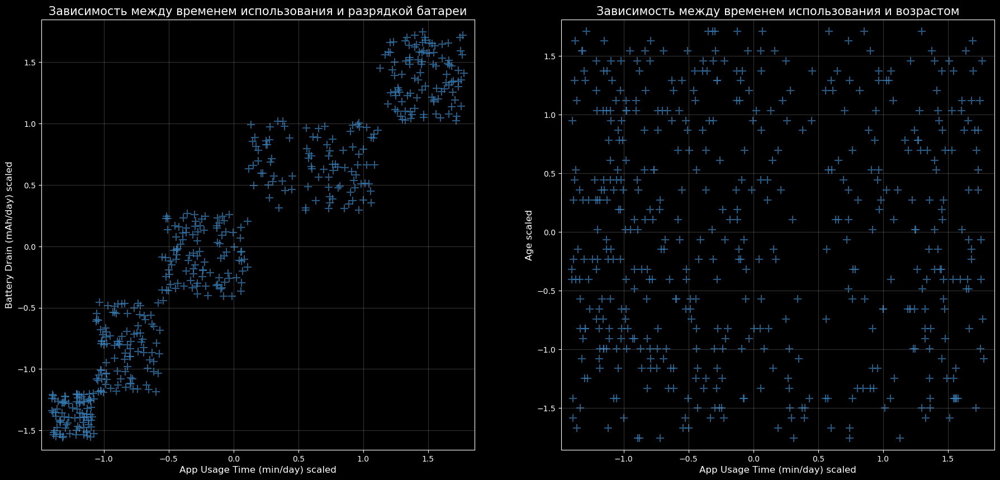

In [28]:
colors = np.array(
    ["#377eb8", "#ff7f00"]
)  # цвета для данных. В этот раз для разнообразия Оранжевый (аномалии) и Синий (нормальные)

fig = plt.figure(figsize=(22, 10))

ax = plt.subplot(1, 2, 1)
plot_data(
    ax,
    df_train_time_battery,
    colors=colors,
    name="Зависимость между временем использования и разрядкой батареи",
)
ax = plt.subplot(1, 2, 2)
plot_data(
    ax,
    df_train_time_age,
    colors=colors,
    name="Зависимость между временем использования и возрастом",
)

## Поиск аномалий

Функция для визуализации принятия решений об аномальности данных.

In [29]:
def viz_anomaly(data, algorithm, colors, response_method="auto"):
    """Визуализация принятия решений и данных
    Входные переменные:
    ===========
    data: данные которые будем визуализировать
    algorithm: Класс модели машинного обучения для которого мы хотим узнать границы решений
    colors: цвета, которые будут использоваться для раскраски разных классов
    response_method: что визуализируем, результаты метода decision_function, predict_proba или predict. auto перебирает первый возможный вариант
    """

    # cm_bright = ListedColormap(colors[::-1]) # формируем цветовую карту из наших цветов
    cm_bright = ListedColormap(["red", "blue"])
    # отрисовываем границу принятия решений с помощью Класса библиотеки scikit-learn
    disp = DecisionBoundaryDisplay.from_estimator(
        algorithm,  # Какой алгоритм используем
        data,  # на каких данных проверяем
        response_method=response_method,  # что визуализируем
        cmap=cm_bright,  # какую цветовую карту используем
        alpha=0.5,  # прозрачность
    )

    # визуализируем просто данные с помощью нашей функции
    plot_data(disp.ax_, data, colors=colors)

### ***EllipticEnvelope***

#### Признаки время использования и разряд батареи

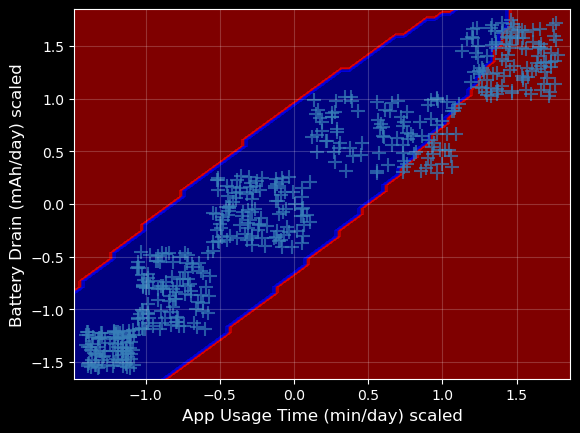

In [30]:
contamination = 0.2

# Создаем объект класса
ell_env_battery = EllipticEnvelope(contamination=contamination)
# Обучаем модель
ell_env_battery.fit(df_train_time_battery)

# визуализируем результат
viz_anomaly(df_train_time_battery, ell_env_battery, colors, response_method="predict");

Разряд батареи для случаев, когда девайс использовался очень долго в течении дня, оказывается немного заниженной относительно общего тренда.  
Поэтому большая часть наблюдений из самого правого облака точек отнесена к выбросам.

In [31]:
ell_env_battery.covariance_

array([[0.40720224, 0.46461164],
       [0.46461164, 0.60377356]])

Из матрицы ковариаций видим, что между переменными наблюдается положительная линейная зависимость  
(ковариация положительная) (что было видно из графика).

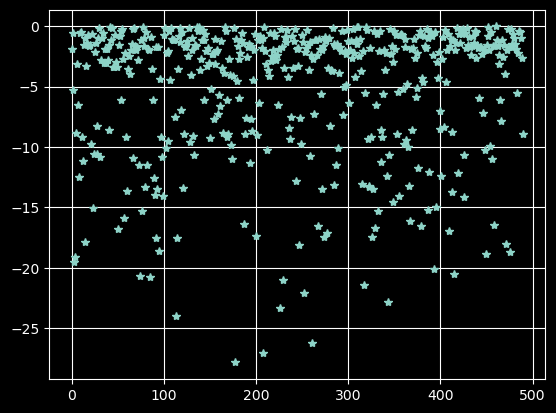

In [32]:
plt.plot(ell_env_battery.score_samples(df_train_time_battery), "*")
plt.grid();

Видим, что большинство точек можно рассматривать как "нормальные".

#### Признаки время использования и возраст

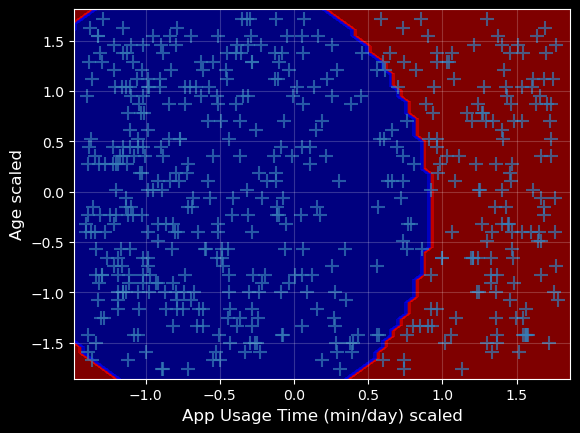

In [33]:
contamination = 0.3

# Создаем объект класса
ell_env_age = EllipticEnvelope(contamination=contamination)
# Обучаем модель
ell_env_age.fit(df_train_time_age)

# визуализируем результат
viz_anomaly(df_train_time_age, ell_env_age, colors, response_method="predict");

Так как большая часть наблюдений имеет время использования девайса меньше среднего,  
то наблюдения с длительным временем использования рассматриваются как выбросы.

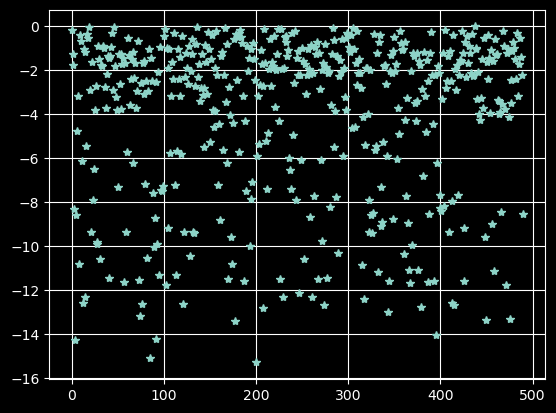

In [34]:
plt.plot(ell_env_age.score_samples(df_train_time_age), "*")
plt.grid();

Здесь точки распределены не так плотно относительно 0.

### ***IsolationForest***

#### Признаки время использования и разряд батареи

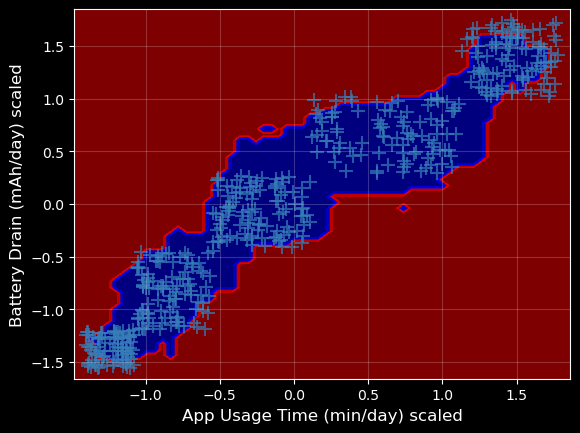

In [35]:
contamination = 0.2
n_estimators = 50
random_state = RANDOM_STATE

# Создаем объект класса
iso_forest_battery = IsolationForest(
    contamination=contamination, n_estimators=n_estimators, random_state=random_state
)
# Обучаем модель
iso_forest_battery.fit(df_train_time_battery)

viz_anomaly(
    df_train_time_battery, iso_forest_battery, colors, response_method="predict"
);

Изолирующий лес в качестве аномалий выделил в основном наблюдения с самыми большими и самыми малыми значениями  
признаков разряд батареи и времени использования.

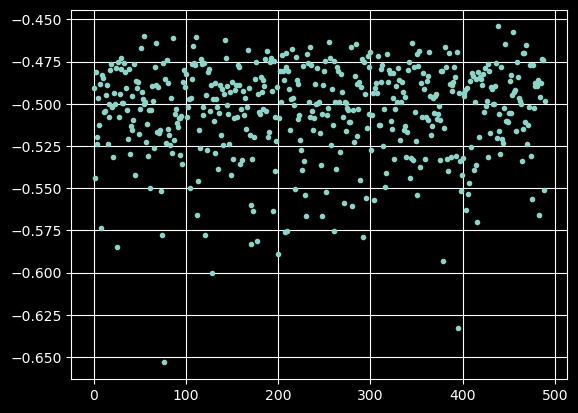

In [36]:
plt.plot(
    iso_forest_battery.score_samples(df_train_time_battery),
    ".",
)
plt.grid();

В основным наблюдения сконцентрированы около -0.5, точки ниже -0.525 вероятно расцениваются как аномалии.

#### Признаки время использования и возраст

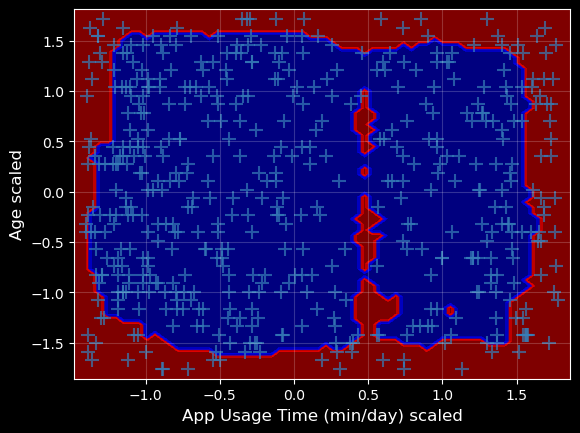

In [37]:
contamination = 0.2
n_estimators = 100
random_state = RANDOM_STATE

# Создаем объект класса
iso_forest_age = IsolationForest(
    contamination=contamination, n_estimators=n_estimators, random_state=random_state
)
# Обучаем модель
iso_forest_age.fit(df_train_time_age)

viz_anomaly(df_train_time_age, iso_forest_age, colors, response_method="predict");

Изолирующий лес выделил две области, характеризующие "нормальные" наблюдения.  
Наблюдения, которые имеют крайние значения (наиболее высокие или низкие) по хотя бы одному из признаков,  
таких как возраст или время использования, классифицируются как аномалии.

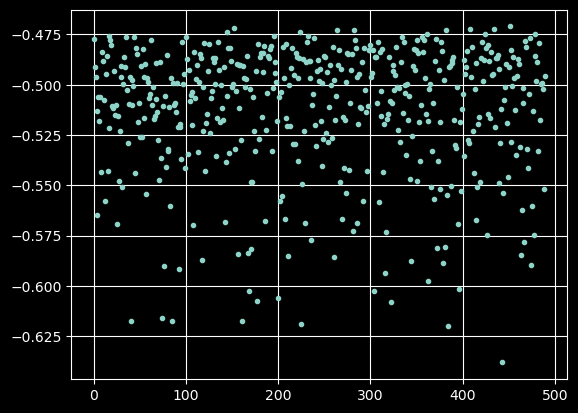

In [38]:
plt.plot(
    iso_forest_age.score_samples(df_train_time_age),
    ".",
)
plt.grid();

В основном, точки сконцентрированы около -0.5.

### Анализ признаков аномальных наблюдений

Рассмотрим другие признаки наблюдений, которые считаются аномальными по признакам возраста и времени использования.

In [39]:
df_train["Anomaly_ell_env_age"] = (ell_env_age.predict(df_train_time_age) == -1).astype(
    int
)
df_train["Anomaly_iso_forest_age"] = (
    iso_forest_age.predict(df_train_time_age) == -1
).astype(int)
df_train.head()

,User ID,Device Model,Operating System,App Usage Time (min/day),Screen On Time (hours/day),Battery Drain (mAh/day),Number of Apps Installed,Data Usage (MB/day),Age,Gender,User Behavior Class,App Usage Time (min/day) scaled,Battery Drain (mAh/day) scaled,Age scaled,Anomaly_ell_env_age,Anomaly_iso_forest_age
0,511,Google Pixel 5,Android,241,5.3,1767,58,976,38,Female,3,-0.218227,0.242381,-0.063909,0,0
1,636,Samsung Galaxy S21,Android,96,3.4,1198,39,401,48,Female,2,-1.031753,-0.456746,0.782452,0,0
2,439,OnePlus 9,Android,105,3.0,728,24,343,52,Female,2,-0.981258,-1.034232,1.120996,0,0
3,664,Google Pixel 5,Android,469,6.4,1858,78,1297,55,Female,4,1.060973,0.354192,1.374904,1,0
4,503,Xiaomi Mi 11,Android,582,8.4,2664,91,2493,55,Female,5,1.694963,1.344520,1.374904,1,1


Аномальные объекты с точки зрения EllipticEnvelope в среднем имеют большее число установленных приложений.

Text(0.5, 1.0, 'Распределения числа установленных приложений')

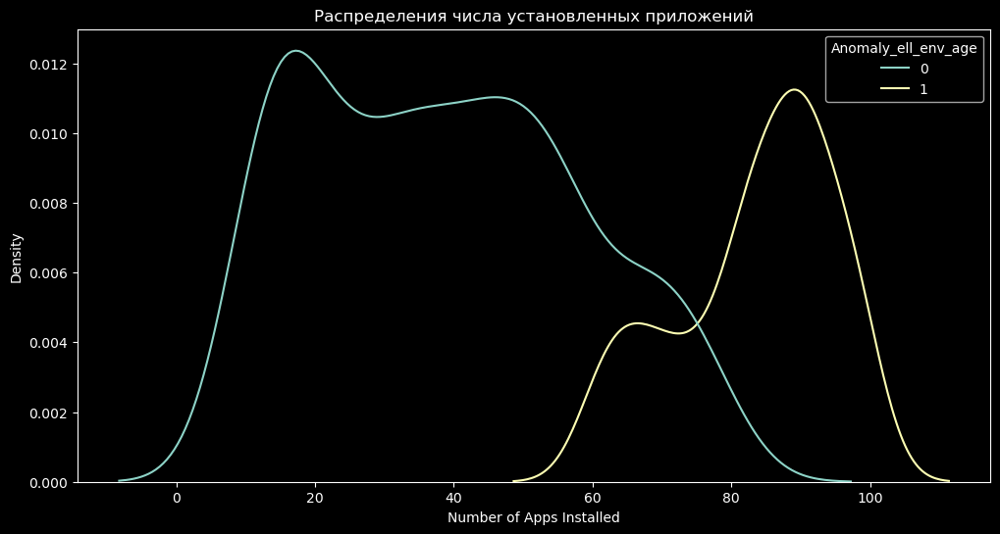

In [40]:
plt.figure(figsize=(12, 6))
sns.kdeplot(
    data=df_train, x="Number of Apps Installed", hue="Anomaly_ell_env_age"
).set_title("Распределения числа установленных приложений")

Что касается аномалий с точки зрения изолирующего леса, то здесь никаких зависимостей увидеть не удается.

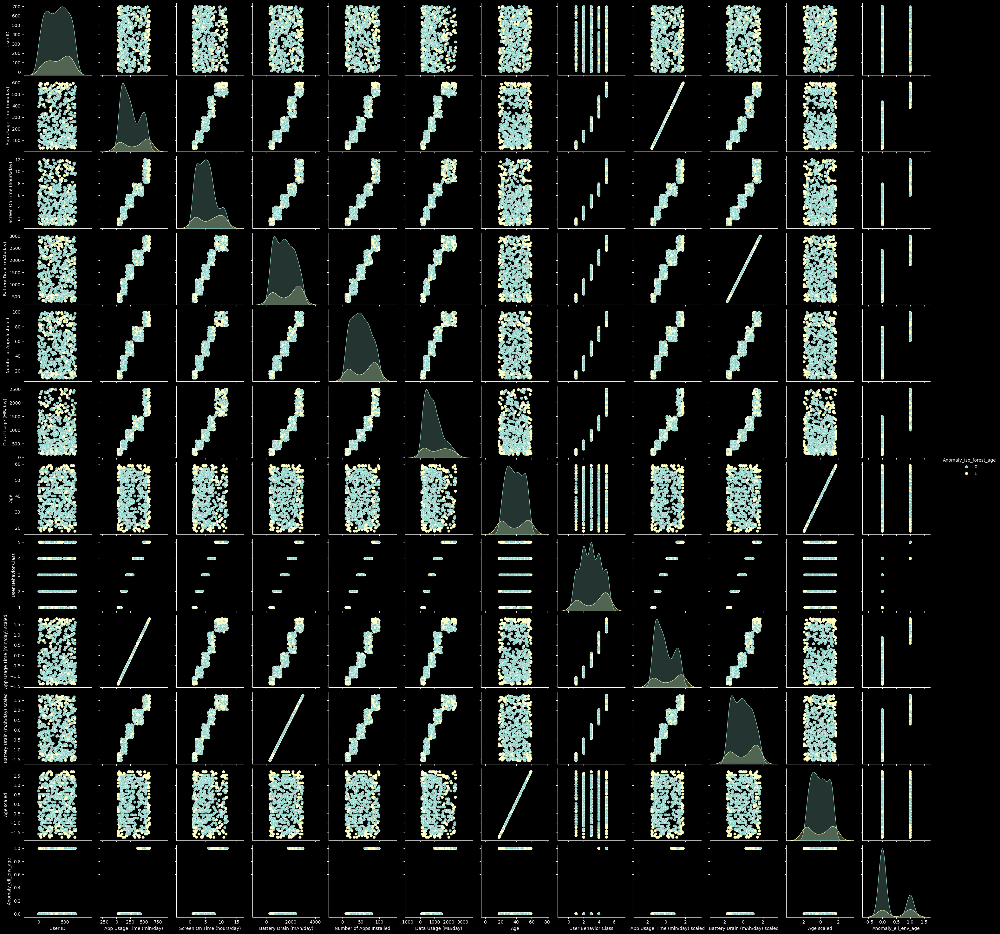

In [41]:
sns.pairplot(data=df_train, hue="Anomaly_iso_forest_age")

### Выводы

**Признаки: App Usage Time (min/day) и Battery Drain (mAh/day)**  
EllipticEnvelope уловил отклонение от общего тренда наблюдений с высоким временем использованием девайса и с высоким потреблением батареи.  
Изолирующий лес же в качестве аномалий посчитал наблюдения с высокими и низкими значениями времени использования и потребления батареи.  
  
**Признаки: App Usage Time (min/day) и Age**    
EllipticEnvelope в качестве аномалий посчитал наблюдения с продолжительным временем использования девайса.  
Изолирующий лес в качестве аномалий выделил наблюдения с очень высокими и низкими значениями признаков.  
В целом, выводы каждого метода имеют право на существование.


## Поиск новизны

### ***EllipticEnvelope***|

#### Признаки время использования и разряд батареи

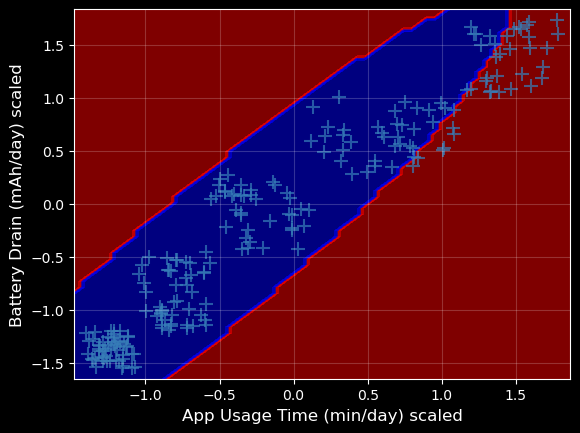

In [42]:
viz_anomaly(df_val_time_battery, ell_env_battery, colors, response_method="predict");

#### Признаки время использования и возраст

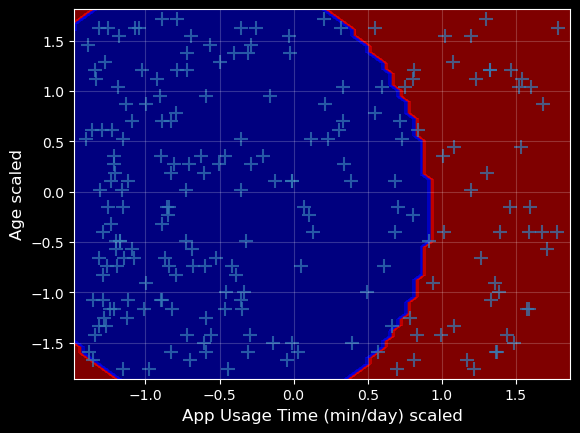

In [43]:
viz_anomaly(df_val_time_age, ell_env_age, colors, response_method="predict");

### ***IsolationForest***

#### Признаки время использования и разряд батареи

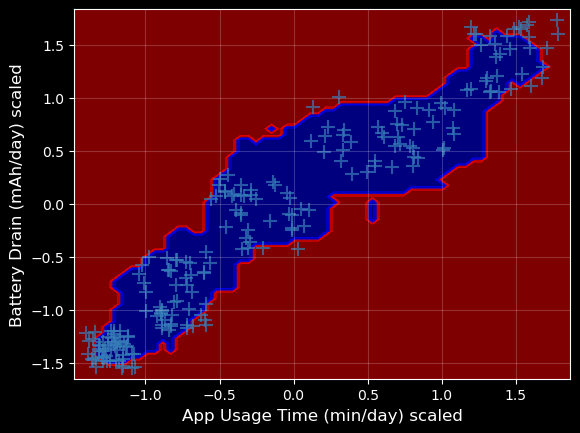

In [44]:
viz_anomaly(df_val_time_battery, iso_forest_battery, colors, response_method="predict");

#### Признаки время использования и возраст

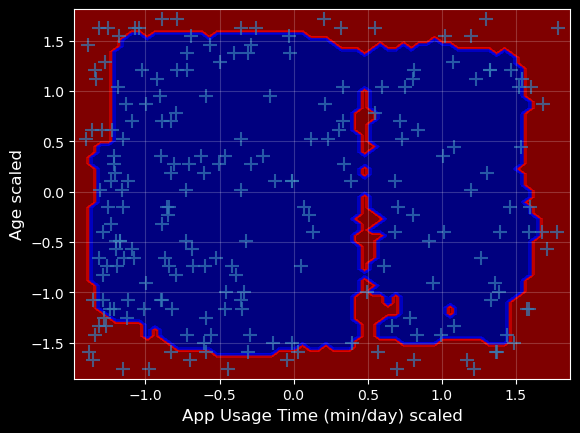

In [45]:
viz_anomaly(df_val_time_age, iso_forest_age, colors, response_method="predict");

Так как данные в валидационной выборке имеют то же распределение, что и в тренировочной, то никакой новизны здесь увидеть не удаётся.  
В качестве аномалий выделяются наблюдения со значениями признаков близкими к значениям признаков аномалий в обучающем наборе.

Что касается анализа остальных признаков, то получаем схожую картину.

In [46]:
df_val["Anomaly_ell_env_age"] = (ell_env_age.predict(df_val_time_age) == -1).astype(int)
df_val["Anomaly_iso_forest_age"] = (
    iso_forest_age.predict(df_val_time_age) == -1
).astype(int)

Число установленных приложений у аномалий по возрасту и времени использования девайса выше.

Text(0.5, 1.0, 'Распределения числа установленных приложений')

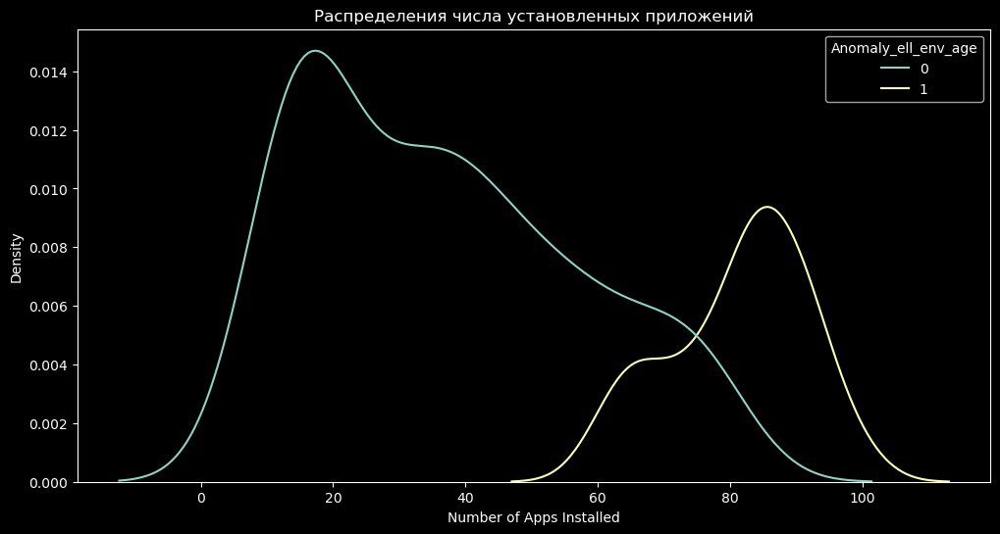

In [47]:
plt.figure(figsize=(12, 6))
sns.kdeplot(
    data=df_val, x="Number of Apps Installed", hue="Anomaly_ell_env_age"
).set_title("Распределения числа установленных приложений")

По выводу изолирующего леса интересных зависимостей уловить не удается.

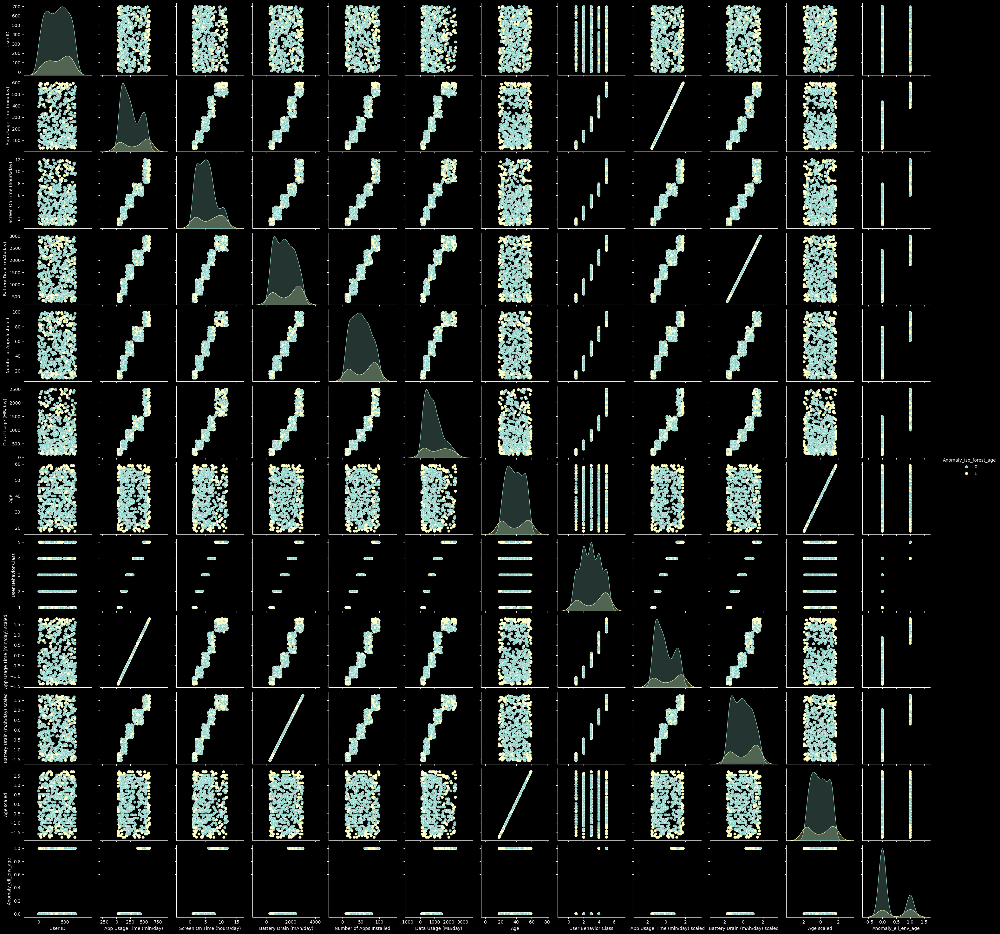

In [48]:
sns.pairplot(data=df_train, hue="Anomaly_iso_forest_age")